In [3]:
from astropy import units as u
from astropy.cosmology import Planck18_arXiv_v2, z_at_value
import numpy as np
import pandas as pd
from scipy.integrate import quad
from scipy.interpolate import interp1d

# Matplotlib settings
import matplotlib
matplotlib.rcParams['figure.figsize'] = (12.0, 8.0)
matplotlib.rcParams['xtick.labelsize'] = 24.0
matplotlib.rcParams['ytick.labelsize'] = 24.0
matplotlib.rcParams['axes.titlesize'] = 27.0
matplotlib.rcParams['axes.labelsize'] = 27.0
matplotlib.rcParams['legend.fontsize'] = 24.0
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['text.latex.preamble'] = r"\usepackage{amsmath}"
matplotlib.rcParams['font.serif'] = ['Computer Modern', 'Times New Roman']
matplotlib.rcParams['font.family'] = ['serif', 'STIXGeneral']
matplotlib.rcParams['legend.frameon'] = True
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size

# Local imports
from cocteau import matrix, observations
from cocteau import observational_utils as utils

import sys
sys.path.append('/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/')
from plot_contours import plot_contours as pc


data_dir = '/Users/r349989/Documents/kilonovae/data/converted_lightcurves/'

# Create dataframe based on Excel document

In [7]:
filter_data = pd.read_csv('/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/data/full_detectability_data.csv',
    usecols=[0,1,2,3,5,6,7,8]).rename(columns={'Effective Wavelength (AA)': 'wavelength_eff',
    'Limiting Magnitude (AB)': 'lim_mag'}).dropna()
filter_data = filter_data[filter_data['bandname'] != 'VistaZ']
filter_data = filter_data[filter_data['Instrument'] != 'Dorado'].reset_index(drop=True)
filter_data

,Instrument,Filter,bandname,wavelength_eff,lim_mag,z50,z95,z5
0,Rubin (LSST) - WFD,u,u-band,3690,23.57,0.0780,0.0120,0.280
1,Rubin (LSST) - WFD,g,g-band,4830,24.65,0.1400,0.0350,0.480
2,Rubin (LSST) - WFD,r,r-band,6220,24.21,0.1200,0.0430,0.430
3,Rubin (LSST) - WFD,i,i-band,7570,23.79,0.0990,0.0380,0.310
4,Rubin (LSST) - WFD,z,z-band,8700,23.21,0.0790,0.0290,0.240
5,Rubin (LSST) - WFD,y,y-band,9700,22.31,0.0520,0.0210,0.140
6,BlackGEM,u,u-bg,3800,21.50,0.0370,0.0130,0.091
7,BlackGEM,g,g-bg,4850,22.60,0.0570,0.0110,0.210
8,BlackGEM,q,vr-bg,5800,23.00,0.0720,0.0270,0.230
9,BlackGEM,r,r-bg,6250,22.30,0.0520,0.0220,0.140


In [8]:
filter_data.to_csv('/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/data/detectability_data.csv')

# Overall plot parameters

In [9]:
# To Do: set colors based on cmap

alpha_color = False


def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=-1):
    if n == -1:
        n = cmap.N
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
         'trunc({name},{a:.2f},{b:.2f})'.format(name=cmap.name, a=minval, b=maxval),
         cmap(np.linspace(minval, maxval, n)))
    return new_cmap





instr_params = {
    'BlackGEM': {'label': 'BlackGEM', 'marker': '^', 'FoV': 8.1, 'exp': 300},
    'DDOTI': {'label': 'DDOTI', 'marker': 'D', 'FoV': 69, 'exp': 7200},
    'DECam': {'label': 'DECam', 'marker': 'X', 'FoV': 2.2, 'exp': 90},
    'GOTO': {'label': 'GOTO', 'marker': '>', 'FoV': 40, 'exp': 360},
    'Rubin (LSST) - WFD': {'label': 'LSST', 'marker': 'd', 'FoV': 9.6, 'exp': 30},
    'MeerLICHT': {'label': 'MeerLICHT', 'marker': 'h', 'FoV': 2.7, 'exp': 60},
    'PRIME': {'label': 'PRIME', 'marker': 'o', 'FoV': 1.56, 'exp': 100},
    'Roman (WFIRST)': {'label': 'Roman', 'marker': '*', 'FoV': 0.28, 'exp': 3500},
    'Swift': {'label': 'Swift', 'marker': 'v', 'FoV': 0.08, 'exp': 80},
    'ULTRASAT': {'label': 'ULTRASAT', 'marker':'8', 'FoV': 200, 'exp': 900},
    'VISTA': {'label': 'VISTA', 'marker':'p', 'FoV': 1.6, 'exp': 360},
    'WINTER': {'label': 'WINTER', 'marker':'P', 'FoV': 1.0, 'exp': 360},
    'ZTF': {'label': 'ZTF', 'marker': 's', 'FoV': 47, 'exp': 30},
}

cmap = truncate_colormap(matplotlib.cm.inferno, minval=0.2)
color_norm = matplotlib.colors.Normalize(vmin=0, vmax=len(instr_params)-1)


# Set color
instr_color_order = ['Roman (WFIRST)', 'Rubin (LSST) - WFD', 'DECam', 'PRIME',
    'BlackGEM', 'VISTA', 'ULTRASAT', 'WINTER', 'GOTO', 'ZTF', 'MeerLICHT', 'Swift', 'DDOTI']
if alpha_color:
    for idx, (instr, instr_data) in enumerate(instr_params.items()):
        instr_data['color'] = cmap(color_norm(idx))
else:
    for idx, instr in enumerate(instr_color_order):
        instr_params[instr]['color'] = cmap(color_norm(idx))



# Scatterplot: FoV vs. Exposure Time

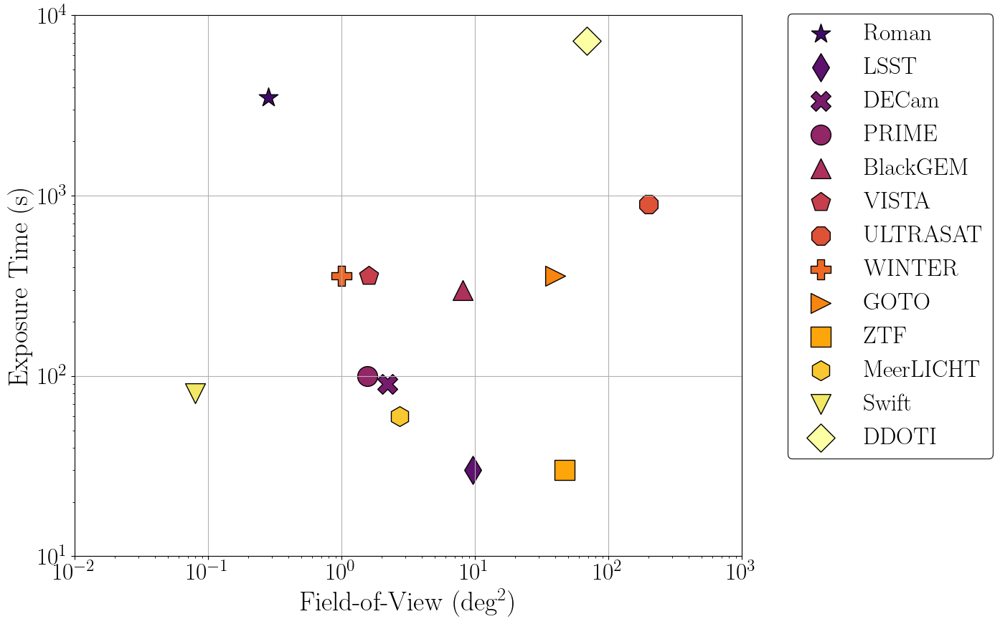

In [15]:
fig, ax = plt.subplots(dpi=100, linewidth=2, figsize=(12, 10))


ax.grid()

for instr in instr_color_order:
    props = instr_params[instr]

    ax.scatter(props['FoV'], props['exp'],
        marker=props['marker'], s=400,
        color=props['color'], edgecolor='k', linewidth=1.0, label=props['label'])

        
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(1e-2, 1e3)
ax.set_ylim(1e1, 1e4)
        
ax.set_xlabel(r'Field-of-View (deg$^2$)')
ax.set_ylabel('Exposure Time (s)')
    
legend = ax.legend(loc='upper left', ncol=1, bbox_to_anchor=(1.05, 1.025))#, bbox_transform=ax.transAxes)
frame = legend.get_frame()
frame.set_edgecolor('k')
plt.savefig(f'/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/figures/fov_exposure.png', 
    bbox_extra_artists=(legend,), bbox_inches='tight')



# Limiting Magnitude Plot

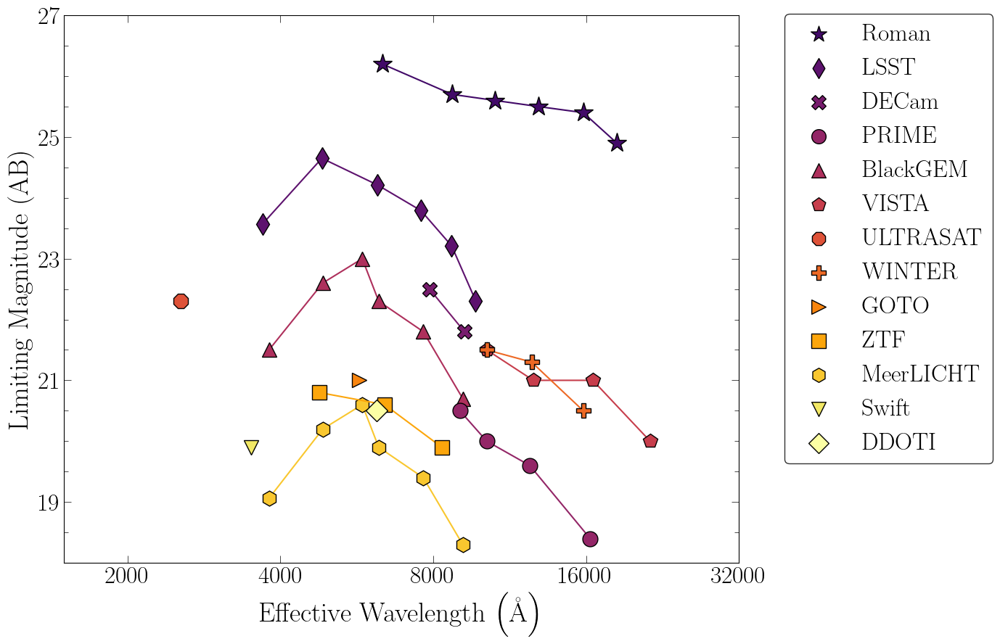

In [12]:
legend_out = True
connecting_lines = True

fig, ax = plt.subplots(dpi=100, linewidth=2, figsize=(12, 10))

for idx, (instr, props) in enumerate(instr_params.items()):
    instr_data = filter_data[filter_data['Instrument'] == instr]

    
    if instr == 'Dorado':
        continue
    
    if connecting_lines:
        
        if instr == 'Roman (WFIRST)':
            ms = 20
        else:
            ms = 15
        if instr == 'DDOTI':
            zorder=5
        else:
            zorder=-1
            
        
        ax.plot(instr_data['wavelength_eff'], instr_data['lim_mag'], f"{props['marker']}-",
            color=props['color'], markersize=ms, markeredgecolor='k', zorder=zorder) #, markeredgewidth=2, ls='-')

    
        
        
    else:
        ax.scatter(instr_data['wavelength_eff'], instr_data['lim_mag'],
            marker=props['marker'], s=200,
            color=props['color'], edgecolor='k', linewidth=0.5, label=props['label'])
        
        
        

ax.set_xlim(1.5e3, 3e4)
ax.set_xscale('log')
ax.set_ylabel('Limiting Magnitude (AB)')
ax.set_xlabel(r'Effective Wavelength $\left(\mathrm{\AA}\right)$')

if legend_out:
    ax.set_ylim(18, 27) 
    ytick_vals = [19, 21, 23, 25, 27]
else:
    ax.set_ylim(18, 30) 
    ytick_vals = [20, 22, 24, 26, 28, 30]
ax.set_yticks(ytick_vals)
ax.set_yticklabels(ytick_vals)

xtick_vals = [2000, 4000, 8000, 16000, 32000]
ax.set_xticks(xtick_vals)
ax.set_xticklabels(xtick_vals)
#ax.xaxis.set_minor_locator(FixedLocator(3000))



ax.minorticks_on()
ax.tick_params(which='major', direction='in', length=7,
    width=0.5, top=True, bottom=True, right=True, left=True)
ax.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=True, left=True)

if alpha_color:
    color_label = 'alphacolor'
else:
    color_label = 'verticalcolor'
    
if connecting_lines:
    line_label = '_lines'
    
    # Manually make legend with scatter plot
    for instr in instr_color_order:
        prop = instr_params[instr]
        if instr == 'Dorado':
            continue
        elif instr == 'Roman (WFIRST)':
            ms = 200*(4/3)
        else:
            ms = 200
        
        
        ax.scatter(-100, 10,
            marker=prop['marker'], s=ms,
            color=prop['color'], edgecolor='k', label=prop['label'])
        
    
    
else:
    line_label = ''
    
#ax.grid()
    


if legend_out:
    legend = ax.legend(loc='upper left', ncol=1, bbox_to_anchor=(1.05, 1.025))#, bbox_transform=ax.transAxes)
    frame = legend.get_frame()
    frame.set_edgecolor('k')
    #plt.savefig(f'/Users/r349989/Desktop/mlim_{color_label}{line_label}_legendout.png', bbox_extra_artists=(legend,), bbox_inches='tight')
    plt.savefig(f'/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/figures/mlim_wavelength.png', 
        bbox_extra_artists=(legend,), bbox_inches='tight')

else:
    ax.legend(loc='upper left', ncol=3, frameon=False)
    #plt.savefig(f'/Users/r349989/Desktop/mlim_{color_label}{line_label}.png')

    


# Horizon Redshift Plots

/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:64: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.


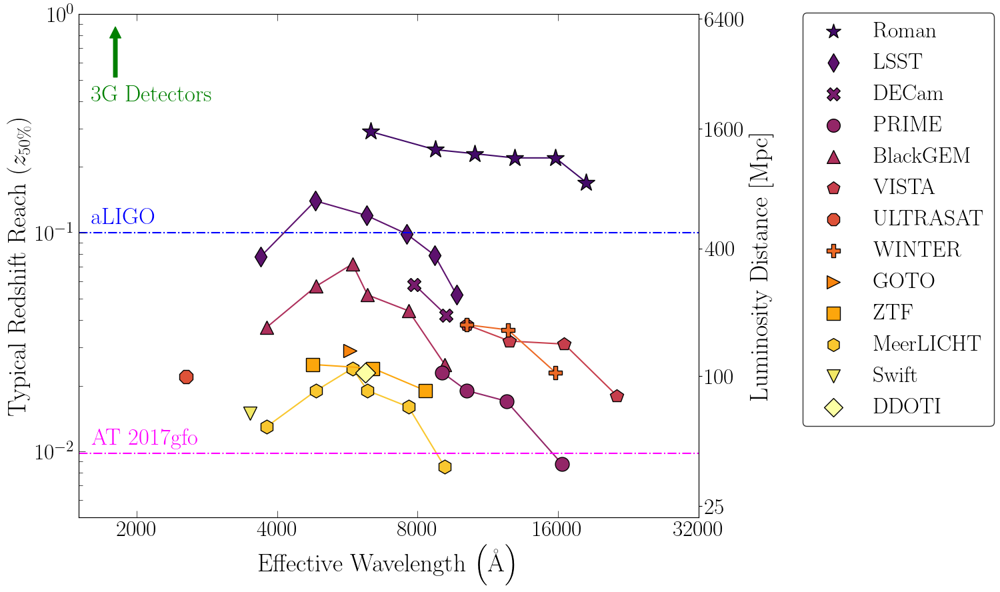

In [14]:
logy = True
legend_out = True
connecting_lines = True
uncertainty = False


# options: None, zhoriz, o3, o4, o5
gwranges = 'zhoriz'


fig, ax = plt.subplots(dpi=100, linewidth=2, figsize=(12, 10))
    
for idx, (instr, props) in enumerate(instr_params.items()):
    instr_data = filter_data[filter_data['Instrument'] == instr]
    
    if instr == 'Dorado':
        continue
    
    if connecting_lines:
        
        if instr == 'Roman (WFIRST)':
            ms = 20
        else:
            ms = 15
        if instr == 'DDOTI':
            zorder=5
        else:
            zorder=-1
        
            
        
        ax.plot(instr_data['wavelength_eff'], instr_data['z50'], f"{props['marker']}-",
            color=props['color'], markersize=ms, markeredgecolor='k', zorder=zorder) #, markeredgewidth=2, ls='-')

    else:
        ax.scatter(instr_data['wavelength_eff'], instr_data['z50'],
            marker=props['marker'], s=200,
            color=props['color'], edgecolor='k', linewidth=0.5, label=props['label'])

        
        

xmin = 1.5e3
xmax = 3.2e4
ax.set_xlim(xmin, xmax)
ax.set_xscale('log')
        
        
if gwranges == 'zhoriz':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    aligo = 0.1
    voyager = 0.45
    wl_text = 1600
    
    ax.axhline(y=at2017gfo, color='magenta', ls='-.', zorder=-1)
    ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
    ax.axhline(y=aligo, color='blue', ls='-.', zorder=-1)
    ax.annotate('aLIGO', (wl_text, aligo*1.1), xycoords='data', color='blue', fontsize=25)
#     ax.axhline(y=voyager, color='orange', ls='-.', zorder=-1)
#     ax.annotate('Voyager', (wl_text, voyager*1.1), xycoords='data', color='orange', fontsize=25)
   
    ax.annotate(s='', xy=(1800,0.9), xytext=(1800,0.5), 
        arrowprops=dict(facecolor='green', shrink=0.05, edgecolor='green'))
        #arrowprops=dict(arrowstyle='->'))
    ax.annotate('3G Detectors', (wl_text, 0.4), xycoords='data', color='green', fontsize=25)




elif gwranges == 'o3':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    hanford = z_at_value(Planck18_arXiv_v2.luminosity_distance, 108 * u.Mpc * 2.264)
    ax.axhline(y=hanford, color='red', ls='-.')
    ax.annotate('LIGO Hanford', (16000, hanford*0.75), xycoords='data', color='red', fontsize=25)
    
    livingston = z_at_value(Planck18_arXiv_v2.luminosity_distance, 135 * u.Mpc * 2.264)
    ax.axhline(y=livingston, color='blue', ls='-.')
    ax.annotate('LIGO Livingston', (wl_text, livingston*1.1), xycoords='data', color='blue', fontsize=25)
    
    
    virgo = z_at_value(Planck18_arXiv_v2.luminosity_distance, 45 * u.Mpc * 2.264)
    ax.axhline(y=virgo, color='purple', ls='-.')
    ax.annotate('Virgo', (wl_text, virgo*1.1), xycoords='data', color='purple', fontsize=25)
    
   
    #ax.set_title('Observing Capability in O3a')

    
    
    
elif gwranges == 'o4':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    ligo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 190 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], z_at_value(Planck18_arXiv_v2.luminosity_distance, 160 * u.Mpc * 2.264),
        ligo_max, color='blue', alpha=0.3)
    ax.annotate('LIGO', (wl_text, ligo_max*1.1), xycoords='data', color='blue', fontsize=25)
   
    virgo_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 90 * u.Mpc * 2.264)
    virgo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 120 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], virgo_min, virgo_max, color='purple', alpha=0.3)
    ax.annotate('Virgo', (wl_text, virgo_min*1.1), xycoords='data', color='purple', fontsize=25)
   
    kagra_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 25 * u.Mpc * 2.264)
    kagra_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 130 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], kagra_min, kagra_max, facecolor='none', edgecolor='green', alpha=0.3, hatch='X')
    ax.annotate('KAGRA', (wl_text, kagra_min*1.1), xycoords='data', color='green', fontsize=25)
   

    #ax.set_title('Observing Capability in O4')

elif gwranges == 'o5':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    aligo = z_at_value(Planck18_arXiv_v2.luminosity_distance, 330 * u.Mpc * 2.264)
    print(aligo)
    ax.axhline(y=aligo, color='blue', ls='-.')
    ax.annotate('aLIGO', (wl_text, aligo*1.1), xycoords='data', color='blue', fontsize=25)
    
    virgo_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 150 * u.Mpc * 2.264)
    virgo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 260 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], virgo_min, virgo_max, color='purple', alpha=0.3)
    ax.annotate('Virgo', (wl_text, virgo_min*1.1), xycoords='data', color='purple', fontsize=25)

    kagra = z_at_value(Planck18_arXiv_v2.luminosity_distance, 130 * u.Mpc * 2.264)
    ax.axhline(y=kagra, color='green', ls='-.')
    ax.annotate('KAGRA', (wl_text, kagra*0.8), xycoords='data', color='green', fontsize=25)
    
    #ax.set_title('Observing Capability in O5')






#ax.set_ylim(0, 0.5)
ax.set_ylabel(r'Typical Redshift Reach $\left(z_{50\%}\right)$')
ax.set_xlabel(r'Effective Wavelength $\left(\mathrm{\AA}\right)$')

xtick_vals = [2000, 4000, 8000, 16000, 32000]
ax.set_xticks(xtick_vals)
ax.set_xticklabels(xtick_vals)
#ax.xaxis.set_minor_locator(FixedLocator(3000))

ax2 = ax.twinx()

if logy:
    ax.set_yscale('log')
    ax2.set_yscale('log')
    zmin = 5e-3
    if legend_out:
        if uncertainty:
            zmax = 2.0
            dist_arr = [25, 100, 400, 1600, 1600*4]
        else:
            zmax = 1.0
            dist_arr = [25, 100, 400, 1600, 1600*4]
    else:
        zmax = 2
        dist_arr = [25, 100, 400, 1600, 1600*4]
            
#     if legend_out:
#         zmax = 1.1
#         dist_arr = [25, 100, 400, 1600]
#     else:
#         zmax = 2
#         dist_arr = [25, 100, 400, 1600, 1600*4]        
    
    
else:
    zmin = 0
    dist_arr = [100, 500, 1000, 1500, 2000]
    if legend_out:
        zmax = 0.3     
    else:
        zmax = 0.4
        



    
ax.set_ylim(zmin, zmax)

ax2.set_yticks([z_at_value(Planck18_arXiv_v2.luminosity_distance, 
    dist * u.Mpc) for dist in dist_arr])
ax2.set_yticklabels(dist_arr)
ax2.set_ylim(zmin, zmax)

ax2.set_ylabel(r'Luminosity Distance $\left[\mathrm{Mpc}\right]$')

ax.minorticks_on()
ax.tick_params(which='major', direction='in', length=7,
    width=0.5, top=True, bottom=True, right=False, left=True)
ax.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=False, left=True)
# ax2.tick_params(which='major', direction='in', length=7,
#     width=0.5, top=False, bottom=False, right=False, left=False)
ax2.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=False, left=False)
#ax.grid()

if logy:
    scale = 'log'
else:
    scale = 'lin'

    
    

if alpha_color:
    color_label = 'alphacolor'
else:
    color_label = 'verticalcolor'
    
if connecting_lines:
    line_label = '_lines'
    
    # Manually make legend with scatter plot
    for instr in instr_color_order:
        if instr == 'Dorado':
            continue
        prop = instr_params[instr]
        if instr == 'Roman (WFIRST)':
            ms = 200*(4/3)
        else:
            ms = 200
        
        
        ax.scatter(-100, 10,
            marker=prop['marker'], s=ms,
            color=prop['color'], edgecolor='k', label=prop['label'])
        
    
   
    
    
else:
    line_label = ''
    
if uncertainty:
    unc_label = '_err'
else:
    unc_label = ''
    
if legend_out:
    legend = ax.legend(loc='upper left', ncol=1, bbox_to_anchor=(1.15, 1.025))#, bbox_transform=ax.transAxes)
    frame = legend.get_frame()
    frame.set_edgecolor('k')
    plt.savefig(f'/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/figures/zhoriz_wavelength.png', 
        bbox_extra_artists=(legend,), bbox_inches='tight')

else:
    ax.legend(loc='upper left', ncol=3, frameon=False)
    #plt.savefig(f'/Users/r349989/Desktop/zhoriz_{scale}_{color_label}{line_label}{unc_label}.png')



/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.


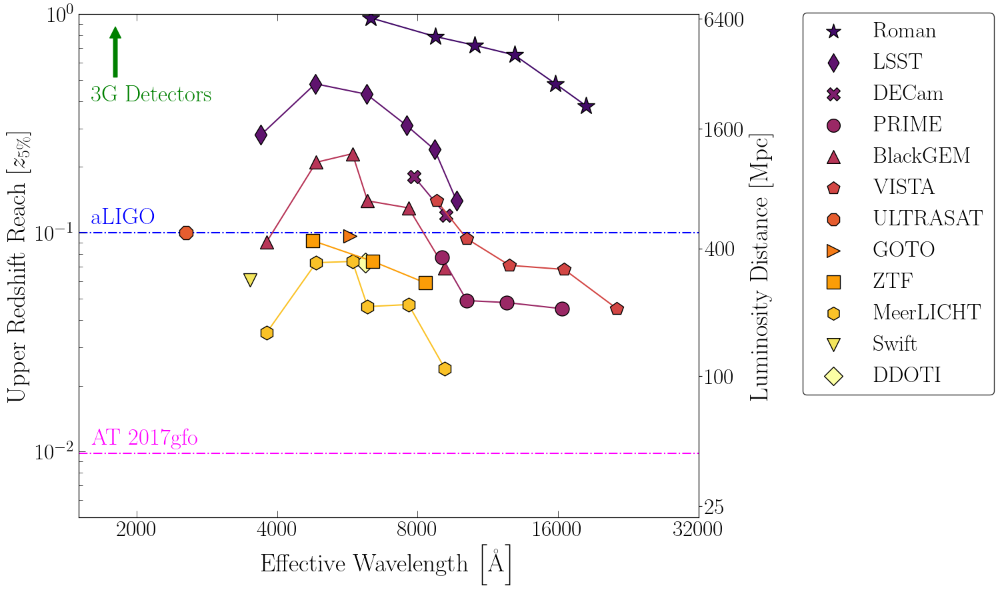

In [316]:
logy = True
legend_out = True
connecting_lines = True
gwranges = 'zhoriz'

fig, ax = plt.subplots(dpi=100, linewidth=2, figsize=(12,10))
    
for idx, (instr, props) in enumerate(instr_params.items()):
    instr_data = filter_data[filter_data['Instrument'] == instr]
    
    if connecting_lines:
        
        if instr == 'Roman (WFIRST)':
            ms = 20
        else:
            ms = 15
        
        ax.plot(instr_data['wavelength_eff'], instr_data['z5'], f"{props['marker']}-",
            color=props['color'], markersize=ms, markeredgecolor='k') #, markeredgewidth=2, ls='-')

    else:
        ax.scatter(instr_data['wavelength_eff'], instr_data['z5'],
            marker=props['marker'], s=200,
            color=props['color'], edgecolor='k', linewidth=0.5, label=props['label'])


if gwranges == 'zhoriz':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    aligo = 0.1
    voyager = 0.45
    wl_text = 1600
    
    ax.axhline(y=at2017gfo, color='magenta', ls='-.', zorder=-1)
    ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
    ax.axhline(y=aligo, color='blue', ls='-.', zorder=-1)
    ax.annotate('aLIGO', (wl_text, aligo*1.1), xycoords='data', color='blue', fontsize=25)
#     ax.axhline(y=voyager, color='orange', ls='-.', zorder=-1)
#     ax.annotate('Voyager', (wl_text, voyager*1.1), xycoords='data', color='orange', fontsize=25)
   
    ax.annotate(s='', xy=(1800,0.9), xytext=(1800,0.5), 
        arrowprops=dict(facecolor='green', shrink=0.05, edgecolor='green'))
        #arrowprops=dict(arrowstyle='->'))
    ax.annotate('3G Detectors', (wl_text, 0.4), xycoords='data', color='green', fontsize=25)




elif gwranges == 'o3':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    hanford = z_at_value(Planck18_arXiv_v2.luminosity_distance, 108 * u.Mpc * 2.264)
    ax.axhline(y=hanford, color='red', ls='-.')
    ax.annotate('LIGO Hanford', (16000, hanford*0.75), xycoords='data', color='red', fontsize=25)
    
    livingston = z_at_value(Planck18_arXiv_v2.luminosity_distance, 135 * u.Mpc * 2.264)
    ax.axhline(y=livingston, color='blue', ls='-.')
    ax.annotate('LIGO Livingston', (wl_text, livingston*1.1), xycoords='data', color='blue', fontsize=25)
    
    
    virgo = z_at_value(Planck18_arXiv_v2.luminosity_distance, 45 * u.Mpc * 2.264)
    ax.axhline(y=virgo, color='purple', ls='-.')
    ax.annotate('Virgo', (wl_text, virgo*1.1), xycoords='data', color='purple', fontsize=25)
    
   
    #ax.set_title('Observing Capability in O3a')

    
    
    
elif gwranges == 'o4':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    ligo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 190 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], z_at_value(Planck18_arXiv_v2.luminosity_distance, 160 * u.Mpc * 2.264),
        ligo_max, color='blue', alpha=0.3)
    ax.annotate('LIGO', (wl_text, ligo_max*1.1), xycoords='data', color='blue', fontsize=25)
   
    virgo_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 90 * u.Mpc * 2.264)
    virgo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 120 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], virgo_min, virgo_max, color='purple', alpha=0.3)
    ax.annotate('Virgo', (wl_text, virgo_min*1.1), xycoords='data', color='purple', fontsize=25)
   
    kagra_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 25 * u.Mpc * 2.264)
    kagra_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 130 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], kagra_min, kagra_max, facecolor='none', edgecolor='green', alpha=0.3, hatch='X')
    ax.annotate('KAGRA', (wl_text, kagra_min*1.1), xycoords='data', color='green', fontsize=25)
   

    #ax.set_title('Observing Capability in O4')

elif gwranges == 'o5':
    # Add typical GW horizon redshifts for 1.4+1.4 BNS
    at2017gfo = 0.0098
    wl_text = 1600
    
#     ax.axhline(y=at2017gfo, color='magenta', ls='-.')
#     ax.annotate('AT 2017gfo', (wl_text, at2017gfo*1.1), xycoords='data', color='magenta', fontsize=25)
   
    aligo = z_at_value(Planck18_arXiv_v2.luminosity_distance, 330 * u.Mpc * 2.264)
    print(aligo)
    ax.axhline(y=aligo, color='blue', ls='-.')
    ax.annotate('aLIGO', (wl_text, aligo*1.1), xycoords='data', color='blue', fontsize=25)
    
    virgo_min = z_at_value(Planck18_arXiv_v2.luminosity_distance, 150 * u.Mpc * 2.264)
    virgo_max = z_at_value(Planck18_arXiv_v2.luminosity_distance, 260 * u.Mpc * 2.264)
    ax.fill_between([xmin, xmax], virgo_min, virgo_max, color='purple', alpha=0.3)
    ax.annotate('Virgo', (wl_text, virgo_min*1.1), xycoords='data', color='purple', fontsize=25)

    kagra = z_at_value(Planck18_arXiv_v2.luminosity_distance, 130 * u.Mpc * 2.264)
    ax.axhline(y=kagra, color='green', ls='-.')
    ax.annotate('KAGRA', (wl_text, kagra*0.8), xycoords='data', color='green', fontsize=25)
    
    #ax.set_title('Observing Capability in O5')



    

ax.set_xlim(1.5e3, 3e4)
ax.set_xscale('log')


#ax.set_ylim(0, 0.5)
ax.set_ylabel(r'Upper Redshift Reach $\left[z_{5\%}\right]$')
ax.set_xlabel(r'Effective Wavelength $\left[\mathrm{\AA}\right]$')

xtick_vals = [2000, 4000, 8000, 16000, 32000]
ax.set_xticks(xtick_vals)
ax.set_xticklabels(xtick_vals)
#ax.xaxis.set_minor_locator(FixedLocator(3000))

ax2 = ax.twinx()

if logy:
    ax.set_yscale('log')
    ax2.set_yscale('log')
    zmin = 5e-3
    if legend_out:
        if uncertainty:
            zmax = 2.0
            dist_arr = [25, 100, 400, 1600, 1600*4]
        else:
            zmax = 1.0
            dist_arr = [25, 100, 400, 1600, 1600*4]
    else:
        zmax = 2
        dist_arr = [25, 100, 400, 1600, 1600*4]
            
#     if legend_out:
#         zmax = 1.1
#         dist_arr = [25, 100, 400, 1600]
#     else:
#         zmax = 2
#         dist_arr = [25, 100, 400, 1600, 1600*4]        
    
    
else:
    zmin = 0
    dist_arr = [100, 500, 1000, 1500, 2000]
    if legend_out:
        zmax = 0.3     
    else:
        zmax = 0.4
        


    
ax.set_ylim(zmin, zmax)

ax2.set_yticks([z_at_value(Planck18_arXiv_v2.luminosity_distance, 
    dist * u.Mpc) for dist in dist_arr])
ax2.set_yticklabels(dist_arr)
ax2.set_ylim(zmin, zmax)

ax2.set_ylabel(r'Luminosity Distance $\left[\mathrm{Mpc}\right]$')

ax.minorticks_on()
ax.tick_params(which='major', direction='in', length=7,
    width=0.5, top=True, bottom=True, right=False, left=True)
ax.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=False, left=True)
# ax2.tick_params(which='major', direction='in', length=7,
#     width=0.5, top=False, bottom=False, right=False, left=False)
ax2.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=False, left=False)

if logy:
    scale = 'log'
else:
    scale = 'lin'

    
    

if alpha_color:
    color_label = 'alphacolor'
else:
    color_label = 'verticalcolor'
    
if connecting_lines:
    line_label = '_lines'
     
    # Manually make legend with scatter plot
    for instr in instr_color_order:
        prop = instr_params[instr]
        if instr == 'Roman (WFIRST)':
            ms = 200*(4/3)
        else:
            ms = 200
        
        
        ax.scatter(-100, 10,
            marker=prop['marker'], s=ms,
            color=prop['color'], edgecolor='k', label=prop['label'])
        
  
    
else:
    line_label = ''
    
    
if legend_out:
    legend = ax.legend(loc='upper left', ncol=1, bbox_to_anchor=(1.15, 1.025))#, bbox_transform=ax.transAxes)
    frame = legend.get_frame()
    frame.set_edgecolor('k')
    plt.savefig(f'/Users/r349989/Desktop/z5_{scale}_{color_label}{line_label}_legendout.png', 
        bbox_extra_artists=(legend,), bbox_inches='tight')

else:
    ax.legend(loc='upper left', ncol=3, frameon=False)
    plt.savefig(f'/Users/r349989/Desktop/z5_{scale}_{color_label}{line_label}.png')



# Parameter Variability Plot

In [337]:
param_restrict_dict = {
    'md': {'low': {'md': [0.001]}, 'high': {'md': [0.1]}},
    'mw': {'low': {'mw': [0.001]}, 'high': {'mw': [0.1]}},
    'vd': {'low': {'vw': [0.05]}, 'high': {'vd': [0.3]}},
    'vw': {'low': {'vw': [0.05]}, 'high': {'vw': [0.3]}},
}

In [192]:
def interpolate_contour(contour):
    return interp1d(contour[:,0], contour[:,1], 
        bounds_error=False, fill_value=0)
     

def z_difference_overtime(contour_func1, contour_func2, min_time=0.25, norm=False):
    """
    Integrate the difference in maximum redshift as a function of time
    """
    
    # Determine maximum time for integral
    redshift_factor = min_time / 0.125 - 1
    max_time = 20 * redshift_factor
    
    # Integrate difference in horizon redshift over time
    diff_func = lambda time: np.fabs(contour_func1(time) - contour_func2(time)) 
    
    if norm:
        avg_func = lambda time: contour_func1(time) + contour_func2(time)
        norm_factor = quad(avg_func, min_time, max_time)[0] / 2
    else:
        norm_factor = 1
    
    
    
    return quad(diff_func, min_time, max_time)[0] / norm_factor

def z_difference_overtime_norm(contour_func1, contour_func2, min_time=0.25):
    return z_difference_overtime(contour_func1, contour_func2, min_time, norm=True)


In [355]:
def plot_param_variability(variability_func=z_difference_overtime_norm, param='md', 
    level=0.5, num_timesteps=10, filter_data=filter_data,
    param_restrict_dict=param_restrict_dict, data_dir=data_dir):
    
        
    # Set up parameter restriction dictionaries
    param_dict = param_restrict_dict[param]
    param_low = param_dict['low']
    param_high = param_dict['high']
        
        
    wavelength_arr = []
    variability_arr = []
    instr_arr = []
        
    # Iterate over all bands
    for idx, band in filter_data.iterrows():
        # Compute contour
        try:
            bandname = band['bandname']

            lim_mag = band['lim_mag']
            instr = instr_params[band['Instrument']]['label']

            if instr == 'LSST':
                instr = 'VRO'

            print(bandname, lim_mag, instr)

            contours_low, min_time, max_time = pc([bandname], num_timesteps=num_timesteps, 
                lim_mags=[lim_mag], instr_list=[instr], 
                data_dir=data_dir, param_restrict=param_low, plot=False)
            contours_high, min_time, max_time = pc([bandname], num_timesteps=num_timesteps, 
                lim_mags=[lim_mag], instr_list=[instr], 
                data_dir=data_dir,  param_restrict=param_high, plot=False)
            contour_low = contours_low[level][-1]
            contour_high = contours_high[level][-1]

            # Determine minimum time for integration
            start_time = max(np.min(contour_low[:,0]), np.min(contour_high[:,0]))
            print(start_time)

            # Interpolate contours
            contour_func_low = interpolate_contour(contour_low)
            contour_func_high = interpolate_contour(contour_high)

            # Compute variability
            variability = variability_func(contour_func_low, contour_func_high, start_time)

            wavelength_arr.append(band['wavelength_eff'])
            variability_arr.append(variability)
            instr_arr.append(band['Instrument'])
        except:
            pass

#         if idx == 1:
#             break
      
    
    return wavelength_arr, variability_arr, instr_arr


u-band 23.57 VRO
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(18,)
0.05 0.265990990990991
(12,)
0.5 0.07587976539589443
(5,)
0.95 0.006620370370370375
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(19,)
0.05 0.2654708520179372
(13,)
0.5 0.07570631970260222
(8,)
0.95 0.01460624593363696
0.25
g-band 24.65 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.4
 0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
0.6
0.75
1.0
(18,)
0.05 0.48676923076923073
(11,)
0.5 0.13477633477633477
(5,)
0.95 0.019792386530014652
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.4
 0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
0.6
0.75
1.0
(18,)
0.05 0.48108108108108105
(13,)
0.5 0.13565549676660787
(11,)
0.95 0.05398753224419606
0.25
r-band 24.21 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.35
 0.4    0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.35
0.4
0.5
0.6
0.75
1.0
(19,)
0.05 0.39571428571428574
(13,)
0.5 0.11884422110552763
(7,)
0.95 0.028557114228456918
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.35
 0.4    0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.35
0.4
0.5
0.6
0.75
1.0
(19,)
0.05 0.3941649899396379
(14,)
0.5 0.12680906713164777
(11,)
0.95 0.05788167938931298
0.25
i-band 23.79 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.3    0.35   0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.35
0.4
0.5
0.6
1.0
(18,)
0.05 0.3018041237113402
(14,)
0.5 0.09202981651376146
(8,)
0.95 0.02696181284095678
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.3    0.35   0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.35
0.4
0.5
0.6
1.0
(16,)
0.05 0.2980508474576271
(16,)
0.5 0.11189510678561775
(12,)
0.95 0.053534418948926736
0.25
z-band 23.21 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.25   0.3    0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(17,)
0.05 0.24242424242424243
(13,)
0.5 0.06880580357142857
(8,)
0.95 0.021488607594936725
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.25   0.3    0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(17,)
0.05 0.2416
(15,)
0.5 0.09047576936681995
(10,)
0.95 0.04482439926062848
0.25
y-band 22.31 VRO
[0.001  0.005  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.25
 0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(15,)
0.05 0.142680412371134
(13,)
0.5 0.04298377028714108
(9,)
0.95 0.01353279434057605
[0.001  0.005  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.25
 0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.005
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(15,)
0.05 0.14345941686367217
(15,)
0.5 0.06404585456229736
(13,)
0.95 0.029958847736625518
0.25
u-bg 21.5 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(13,)
0.05 0.09006493506493507
(14,)
0.5 0.02859324992726215
(11,)
0.95 0.01130987852395141
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.09298245614035087
(13,)
0.5 0.04334188432835821
(13,)
0.95 0.026340951492537314
0.18750000000000003
g-bg 22.6 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(15,)
0.05 0.2
(11,)
0.5 0.05683760683760683
(5,)
0.95 0.005510835913312699
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(16,)
0.05 0.197323600973236
(11,)
0.5 0.05654474002418379
(7,)
0.95 0.013508180943214633
0.18750000000000003
vr-bg 23.0 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(19,)
0.05 0.23066298342541436
(13,)
0.5 0.0681686886192952
(8,)
0.95 0.01683864915572233
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(19,)
0.05 0.22956204379562045
(14,)
0.5 0.07471058434399117
(12,)
0.95 0.03382594417077177
0.18750000000000003
r-bg 22.3 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(14,)
0.05 0.13446356275303645
(13,)
0.5 0.04394079555966698
(10,)
0.95 0.014602272727272731
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(14,)
0.05 0.13539944903581266
(15,)
0.5 0.063603500761035
(14,)
0.95 0.029694744976816078
0.18750000000000003
i-bg 21.8 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5


/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/plot_contours.py:239: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(dpi=100, linewidth=2)


(16,)
0.05 0.13378048780487806
(11,)
0.5 0.04081895246745384
(8,)
0.95 0.010068754774637133
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(16,)
0.05 0.1324390243902439
(12,)
0.5 0.04583005893909627
(10,)
0.95 0.021469026548672582
0.18750000000000003
z-bg 20.7 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.06898809523809524
(12,)
0.5 0.021278173190984583
(8,)
0.95 0.007298959318826871
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(15,)
0.05 0.0697597137014315
(14,)
0.5 0.034440891807811964
(12,)
0.95 0.012725233644859814
0.18750000000000003
u-bg 19.06 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.032741477272727276
(10,)
0.5 0.009336746844486783
(6,)
0.95 0.0025960591133004935
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.03742236024844721
(13,)
0.5 0.016997900197628462
(11,)
0.95 0.007243767313019393
0.18750000000000003
g-bg 20.2 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(12,)
0.05 0.07294238683127573
(7,)
0.5 0.019431668856767413
(3,)
0.95 0.002331184528605964
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(12,)
0.05 0.0724686847599165
(8,)
0.5 0.0199131996408261
(6,)
0.95 0.005636583400483482
0.18750000000000003
Ru 20.6 MeerLICHT
[]
r-bg 19.9 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(12,)
0.05 0.0453609785202864
(12,)
0.5 0.0160793089092423
(9,)
0.95 0.005678418803418804
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(13,)
0.05 0.04724438902743142
(12,)
0.5 0.022866219555241794
(13,)
0.95 0.01128662195552418
0.18750000000000003
i-bg 19.4 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(13,)
0.05 0.046276595744680855
(9,)
0.5 0.013752057048820624
(5,)
0.95 0.0026000000000000016
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(13,)
0.05 0.046251253761283855
(10,)
0.5 0.018461601041327692
(9,)
0.95 0.0065115384615384644
0.18750000000000003
z-bg 18.3 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(12,)
0.05 0.023196311947752596
(10,)
0.5 0.007195482656628126
(5,)
0.95 0.0016024171056709022
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(12,)
0.05 0.024146757679180886
(12,)
0.5 0.011706484641638228
(10,)
0.95 0.005474820143884893
0.18750000000000003
w-band 20.5 DDOTI
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(16,)
0.05 0.07187898089171973
(11,)
0.5 0.022825167868689385
(6,)
0.95 0.004548903878583476
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(16,)
0.05 0.07119514472455649
(13,)
0.5 0.023721377717914185
(14,)
0.95 0.011096786607658268
0.15625
ZTF_g 20.8 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(15,)
0.05 0.09160026560424966
(10,)
0.5 0.02375120076849184
(5,)
0.95 0.003988970588235295
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(16,)
0.05 0.09136986301369864
(11,)
0.5 0.0244807156133829
(8,)
0.95 0.0085944530046225
0.18750000000000006
ZTF_r 20.6 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(16,)
0.05 0.07363996043521266
(11,)
0.5 0.022914853101196956
(7,)
0.95 0.005533748055987559
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(16,)
0.05 0.073125
(12,)
0.5 0.024448574969021065
(13,)
0.95 0.010898389095415122
0.18750000000000003
ZTF_i 19.9 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.5
(17,)
0.05 0.055414551607445
(11,)
0.5 0.017974198047419804
(6,)
0.95 0.004192200557103066
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.5
(17,)
0.05 0.05530050083472454
(13,)
0.5 0.020583695127834055
(14,)
0.95 0.010033767486734202
0.18750000000000006
PrimeZ 20.5 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(16,)
0.05 0.06662162162162162
(13,)
0.5 0.020851328903654487
(8,)
0.95 0.006763425253991294
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(16,)
0.05 0.06706827309236948
(16,)
0.5 0.02955048715677591
(14,)
0.95 0.011387327542156364
0.18750000000000003
PrimeY 20.0 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.04738544474393531
(14,)
0.5 0.016132093933463796
(9,)
0.95 0.005909763313609468
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.04868530884808014
(14,)
0.5 0.022505149330587025
(16,)
0.95 0.01124356333676622
0.18750000000000003
PrimeJ 19.6 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.040246913580246915
(16,)
0.5 0.011754930201639709
(10,)
0.95 0.005330390583199573
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.04719643293427803
(14,)
0.5 0.023017857142857145
(16,)
0.95 0.011301785714285716
0.18750000000000003
PrimeH 18.4 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.01825
(11,)
0.5 0.005455481622306717
(9,)
0.95 0.0027594951639537627
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.024390722788072156
(16,)
0.5 0.01672543649435125
(16,)
0.95 0.008549543676662323
0.18750000000000003
U-band 19.9 Swift
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(13,)
0.05 0.05767167381974249
(9,)
0.5 0.014728431935669155
0.95 0.014728431935669155
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(13,)
0.05 0.05718085106382978
(9,)
0.5 0.014726687553403589
(4,)
0.95 0.0028068122724909006
0.18750000000000003
RomanR 26.2 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.


0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(17,)
0.05 0.9329787234042554
(13,)
0.5 0.27714757709251103
(7,)
0.95 0.05174947368421057
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(17,)
0.05 0.9289473684210526
(13,)
0.5 0.28590664272890487
(10,)
0.95 0.11429521276595747
0.31250000000000006
RomanZ 25.7 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(17,)
0.05 0.7574850299401197
(14,)
0.5 0.21251673360107098
(9,)
0.95 0.049724590163934476
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(15,)
0.05 0.7474154135338347
(13,)
0.5 0.2660152671755725
(12,)
0.95 0.11570121951219514
0.31250000000000006
RomanY 25.6 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(15,)
0.05 0.7085294117647059
(12,)
0.5 0.19252017380509
(10,)
0.95 0.04785312500000005
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(15,)
0.05 0.7088167053364269
(13,)
0.5 0.2686556927297668
(12,)
0.95 0.12613146551724141
0.31250000000000006
RomanJ 25.5 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00]
Minimum timestep: 0.28125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
(16,)
0.05 0.65389369592089
(12,)
0.5 0.17308294209702663
(11,)
0.95 0.039005329780146585
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00]
Minimum timestep: 0.28125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
(16,)
0.05 0.6606583072100314
(14,)
0.5 0.27548612628359187
(13,)
0.95 0.1576512455516015
0.28125
RomanH 25.4 Roman
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(16,)
0.05 0.4666666666666667
(12,)
0.5 0.15814682184422563
(10,)
0.95 0.032908697944122316
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(15,)
0.05 0.48848920863309353
(2,)
(13,)
0.5 0.29887044721069617
(15,)
0.95 0.20033409530508178
0.25
RomanF 24.9 Roman
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(13,)
0.05 0.28677042801556424
(13,)
0.5 0.10174987133299022
(10,)
0.95 0.018947996661101845
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(16,)
0.05 0.42554027504911585
(2,)
(13,)
0.5 0.2667592776344513
(13,)
0.95 0.13248663101604283
0.25
VistaZ 22.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(17,)
0.05 0.14048463356973995
(15,)
0.5 0.04107771260997068
(12,)
0.95 0.012733408323959508
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(17,)
0.05 0.13949483352468428
(17,)
0.5 0.053316326530612246
(15,)
0.95 0.026354708944628494
0.15625
VistaY 21.5 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(15,)
0.05 0.09289596273291925
(16,)
0.5 0.028782581055308325
(12,)
0.95 0.010839433293978752
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(15,)
0.05 0.0936062246278755
(15,)
0.5 0.04437874892887747
(16,)
0.95 0.0266619740340998
0.18750000000000003
VistaJ 21.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(13,)
0.05 0.06605322763306909
(14,)
0.5 0.021534845132743365
(14,)
0.95 0.01030295685894329
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(13,)
0.05 0.0737635352648522
(16,)
0.5 0.044819654030180345
(18,)
0.95 0.02600306670074112
0.18750000000000003
VistaH 21.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(12,)
0.05 0.04723844282238443
(15,)
0.5 0.01940399212819792
(16,)
0.95 0.010181332583637898
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(15,)
0.05 0.07654999999999999
(15,)
0.5 0.04824693590516375
(19,)
0.95 0.02693575655114117
0.15625
VistaKs 20.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.25
0.5
(12,)
0.05 0.023974899810166633
(15,)
0.5 0.010136047247416156
(11,)
0.95 0.005364114114114115
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.25
0.5
(13,)
0.05 0.04912952060555088
(16,)
0.5 0.0326064835005088
(17,)
0.95 0.01263462233465848
0.18750000000000003
ULTRASAT 22.3 ULTRASAT
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(16,)
0.05 0.10108695652173913
(9,)
0.5 0.022585593597154292
0.95 0.022585593597154292
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(16,)
0.05 0.10076754385964912
(9,)
0.5 0.022553423462712607
(4,)
0.95 0.003298037190082647
0.15625
DECam_i 22.5 DECam
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(19,)
0.05 0.17977099236641222
(15,)
0.5 0.05144457547169812
(9,)
0.95 0.015577658760520283
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(18,)
0.05 0.17799377916018663
(15,)
0.5 0.06460469732054251
(13,)
0.95 0.02773984294981223
0.15625
DECam_z 21.8 DECam
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(16,)
0.05 0.11858490566037735
(14,)
0.5 0.03658175355450237
(10,)
0.95 0.012129032258064517
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(16,)
0.05 0.11869602763385147
(13,)
0.5 0.04789144471347861
(14,)
0.95 0.025827280064568203
0.15625
WinterY 21.5 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(15,)
0.05 0.09259708737864078
(14,)
0.5 0.028921415153412653
(10,)
0.95 0.010746719433451365
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(15,)
0.05 0.09351595006934812
(13,)
0.5 0.04438766672440672
(14,)
0.95 0.026760228353948624
0.18750000000000003
WinterJ 21.3 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(13,)
0.05 0.07450873362445413
(12,)
0.5 0.0238681592039801
(11,)
0.95 0.011048444762245264
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(15,)
0.05 0.08623693379790941
(14,)
0.5 0.04851208308368284
(15,)
0.95 0.026894176581089547
0.18750000000000003
WinterH 20.5 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(13,)
0.05 0.04210307564422278
(13,)
0.5 0.016792886708569675
(10,)
0.95 0.006274921301154251
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(14,)
0.05 0.06819162045594578
(14,)
0.5 0.038886955311151335
(14,)
0.95 0.02458
0.18750000000000003
GOTO 21.0 GOTO
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.35   0.4    0.45   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
(16,)
0.05 0.096301247771836
(12,)
0.5 0.02798290598290598
(5,)
0.95 0.0049186991869918754
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.35   0.4    0.45   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
(16,)
0.05 0.09445454545454546
(14,)
0.5 0.029853168469860903
(11,)
0.95 0.011640513552068476
0.18750000000000003
u-band 23.57 VRO
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(14,)
0.05 0.09596817691477887
(10,)
0.5 0.04165448343079922
(7,)
0.95 0.011532685035116154
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(21,)
0.05 0.4276785714285714
(14,)
0.5 0.14042988741044013
(9,)
0.95 0.013860520094562649
0.25
g-band 24.65 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.4
 0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
0.6
0.75
1.0
(13,)
0.05 0.14828065739570162
(10,)
0.5 0.09452230556652193
(6,)
0.95 0.030264993026499314
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.4
 0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
0.6
0.75
1.0
(21,)
0.05 0.6669703872437358
(16,)
0.5 0.27576112412177983
(8,)
0.95 0.04290220820189279
0.25
r-band 24.21 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.35
 0.4    0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.35
0.4
0.5
0.6
0.75
1.0
(14,)
0.05 0.1308359621451104
(10,)
0.5 0.07476830398517145
(7,)
0.95 0.0336153161175423
[0.001  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.3    0.35
 0.4    0.5    0.6    0.75   1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.35
0.4
0.5
0.6
0.75
1.0
(23,)
0.05 0.6528
(19,)
0.5 0.26965678627145084
(12,)
0.95 0.05577395577395582
0.25
i-band 23.79 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.3    0.35   0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.35
0.4
0.5
0.6
1.0
(14,)
0.05 0.09848920863309353
(11,)
0.5 0.06471275105091079
(8,)
0.95 0.0293724966622163
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.3    0.35   0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.35
0.4
0.5
0.6
1.0
(20,)
0.05 0.44587973273942094
(17,)
0.5 0.22539015606242496
(14,)
0.95 0.05725138121546965
0.25
z-band 23.21 VRO
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.25   0.3    0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.025
0.05
0.075
0.1
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(14,)
0.05 0.08558718861209964
(12,)
0.5 0.05082450649975927
(10,)
0.95 0.02633489722966935
[0.001  0.0098 0.025  0.05   0.075  0.1    0.2    0.25   0.3    0.4
 0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.025
0.05
0.075
0.1
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(19,)
0.05 0.33057142857142857
(16,)
0.5 0.16575175358340957
(15,)
0.95 0.052833753148614625
0.25
y-band 22.31 VRO
[0.001  0.005  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.25
 0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(15,)
0.05 0.06514598540145985
(12,)
0.5 0.035351373182552506
(9,)
0.95 0.012759615384615388
[0.001  0.005  0.0098 0.025  0.05   0.075  0.1    0.15   0.2    0.25
 0.3    0.4    0.5    0.6    1.    ]
Minimum timestep: 0.25
0.001
0.005
0.0098
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.4
0.5
0.6
1.0
(17,)
0.05 0.2104878048780488
(18,)
0.5 0.10669203222918533
(14,)
0.95 0.03480952380952384
0.25
u-bg 21.5 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(13,)
0.05 0.04684061353784595
(11,)
0.5 0.021288587464920485
(11,)
0.95 0.011059401309635173
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.2036259541984733
(14,)
0.5 0.06966195569136745
(15,)
0.95 0.026751313485113844
0.18750000000000003
g-bg 22.6 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(12,)
0.05 0.0690990772219524
(8,)
0.5 0.036468599033816426
(5,)
0.95 0.011369831894593369
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(18,)
0.05 0.35
(15,)
0.5 0.10620423892100192
(9,)
0.95 0.01278078484438432
0.18750000000000006
vr-bg 23.0 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(14,)
0.05 0.07305625790139064
(11,)
0.5 0.043948462177888614
(10,)
0.95 0.0257689110556941
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(20,)
0.05 0.40953090096798217
(20,)
0.5 0.1595197740112994
(12,)
0.95 0.038833746898263063
0.18750000000000003
r-bg 22.3 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(15,)
0.05 0.06647973950795948
(14,)
0.5 0.03514402973517114
(10,)
0.95 0.01325446428571429
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(16,)
0.05 0.2018811881188119
(18,)
0.5 0.10105890944498541
(14,)
0.95 0.04115646258503401
0.18750000000000003
i-bg 21.8 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(13,)
0.05 0.04776777512401249
(11,)
0.5 0.027677751240124934
(7,)
0.95 0.011425161136309384
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(18,)
0.05 0.20353728489483747
(17,)
0.5 0.08869663648124192
(11,)
0.95 0.023587257617728556
0.18750000000000003
z-bg 20.7 BlackGEM
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.037776659959758555
(11,)
0.5 0.017765511286542496
(8,)
0.95 0.008665158371040729
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(15,)
0.05 0.09176321506154961
(14,)
0.5 0.04916290193994154
(13,)
0.95 0.016435986159169566
0.18750000000000006
u-bg 19.06 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(13,)
0.05 0.02110784837159637
(9,)
0.5 0.007834879675268193
(6,)
0.95 0.0030484720758693377
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(13,)
0.05 0.046863706763035626
(12,)
0.5 0.02212592304702682
(11,)
0.95 0.009415204678362576
0.18750000000000006
g-bg 20.2 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(9,)
0.05 0.02389108609674475
(7,)
0.5 0.013910860967447522
(3,)
0.95 0.0026146179401993364
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(16,)
0.05 0.11755674232309746
(11,)
0.5 0.04210291493158834
(5,)
0.95 0.004303921568627452
0.18750000000000003
Ru 20.6 MeerLICHT
[]
r-bg 19.9 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(12,)
0.05 0.024329165664823273
(12,)
0.5 0.011410961501991276
(9,)
0.95 0.005493867717915024
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(14,)
0.05 0.060689045936395764
(14,)
0.5 0.03447292513439098
(14,)
0.95 0.012073170731707324
0.18750000000000003
i-bg 19.4 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(11,)
0.05 0.022738833746898265
(8,)
0.5 0.008656152456053886
(7,)
0.95 0.005063249548217513
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.25
0.5
(15,)
0.05 0.062277486910994766
(13,)
0.5 0.029510284035259553
(9,)
0.95 0.007864721485411147
0.18750000000000003
z-bg 18.3 MeerLICHT
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(13,)
0.05 0.010331991951710261
(9,)
0.5 0.005563460443938532
(5,)
0.95 0.001455696202531646
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.25  0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.25
0.5
(14,)
0.05 0.036559734513274336
(13,)
0.5 0.01659432387312187
(10,)
0.95 0.005540044085231449
0.18750000000000003
w-band 20.5 DDOTI
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(13,)
0.05 0.024100888011840158
(11,)
0.5 0.016008880118401576
(10,)
0.95 0.007576335877862596
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(19,)
0.05 0.11238390092879257
(17,)
0.5 0.05031297709923664
(14,)
0.95 0.010872403560830862
0.15625
ZTF_g 20.8 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(13,)
0.05 0.029476351351351356
(10,)
0.5 0.016112000985707246
(6,)
0.95 0.006024584717607974
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(17,)
0.05 0.13605851979345954
(15,)
0.5 0.05767167381974249
(9,)
0.95 0.008365853658536588
0.18750000000000003
ZTF_r 20.6 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(13,)
0.05 0.02425253230876703
(11,)
0.5 0.016613691931540345
(7,)
0.95 0.007473619631901842
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.5
(19,)
0.05 0.11261538461538462
(17,)
0.5 0.05325314379442318
(14,)
0.95 0.012098092643051771
0.18750000000000003
ZTF_i 19.9 ZTF
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.5
(14,)
0.05 0.023752353243196987
(11,)
0.5 0.012523532431969877
(8,)
0.95 0.005428378378378379
[0.001  0.0025 0.005  0.0098 0.01   0.025  0.05   0.075  0.1    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0098
0.01
0.025
0.05
0.075
0.1
0.5
(16,)
0.05 0.07126132930513594
(15,)
0.5 0.03655259822560203
(14,)
0.95 0.0100279459711225
0.18750000000000003
PrimeZ 20.5 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.024658237356034052
(12,)
0.5 0.016444667000500752
(10,)
0.95 0.007849315068493153
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(17,)
0.05 0.08598615916955017
(16,)
0.5 0.04914698162729659
(15,)
0.95 0.012977358490566046
0.18750000000000003
PrimeY 20.0 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(14,)
0.05 0.024100636717368232
(14,)
0.5 0.013266537904394013
(9,)
0.95 0.006322485207100595
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(15,)
0.05 0.06664374140302613
(15,)
0.5 0.03596260815822003
(16,)
0.95 0.011658946149392014
0.18750000000000003
PrimeJ 19.6 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(16,)
0.05 0.02879581151832461
(15,)
0.5 0.01055340399510803
(10,)
0.95 0.005252368804664724
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(12,)
0.05 0.048120230783547366
(15,)
0.5 0.02776847198957752
(17,)
0.95 0.010888722927557883
0.18750000000000003
PrimeH 18.4 PRIME
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(16,)
0.05 0.022068757539203863
(12,)
0.5 0.006708669354838709
(9,)
0.95 0.0028308933373170004
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(13,)
0.05 0.024261432926829266
(16,)
0.5 0.014259908536585365
(13,)
0.95 0.006744482173174874
0.18750000000000006
U-band 19.9 Swift
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(9,)
0.05 0.022944574290484143
(7,)
0.5 0.007726068376068375
(2,)
0.95 0.002184210526315792
[0.001  0.0025 0.005  0.0075 0.0098 0.025  0.05   0.075  0.1    0.2
 0.3    0.4    0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.0098
0.025
0.05
0.075
0.1
0.2
0.3
0.4
0.5
(15,)
0.05 0.08499999999999999
(12,)
0.5 0.029017857142857144
(4,)
0.95 0.002186567164179105
0.18750000000000003
RomanR 26.2 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(13,)
0.05 0.2887221805451363
(10,)
0.5 0.18415195702225634
(8,)
0.95 0.10023023791250961
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(19,)
0.05 1.3473618090452262
(18,)
0.5 0.5457443417277653
(12,)
0.95 0.12773246329526922
0.31250000000000006
RomanZ 25.7 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(13,)
0.05 0.26781456953642385
(11,)
0.5 0.1537675959149876
(9,)
0.95 0.0552742738589212
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(19,)
0.05 1.3147865853658536
(18,)
0.5 0.5469630557294929
(12,)
0.95 0.12786709539121122
0.3125000000000001
RomanY 25.6 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(13,)
0.05 0.2697196261682243
(12,)
0.5 0.15404489623041084
(10,)
0.95 0.05227790697674422
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00 1.50e+00]
Minimum timestep: 0.3125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
1.5
(18,)
0.05 1.062788906009245
(19,)
0.5 0.5099342481417953
(12,)
0.95 0.165699208443272
0.31250000000000006
RomanJ 25.5 Roman
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00]
Minimum timestep: 0.28125
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
(13,)
0.05 0.2812533191715348
(12,)
0.5 0.1553178197719819
(10,)
0.95 0.04306039453717757
[1.00e-03 9.80e-03 1.00e-01 2.00e-01 3.00e-01 4.00e-01 5.00e-01 7.50e-01
 1.00e+00 1.25e+00]
Minimum timestep: 0.28125
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
0.75
1.0
1.25
(17,)
0.05 0.9087152516904583
(17,)
0.5 0.4530546623794212
(13,)
0.95 0.18014354066985652
0.28125
RomanH 25.4 Roman
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(15,)
0.05 0.3253807106598985
(13,)
0.5 0.16211227402473835
(10,)
0.95 0.03726691729323311
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(17,)
0.05 0.8616173120728929
(2,)
(15,)
0.5 0.3670201096892139
(12,)
0.95 0.16468750000000004
0.25
RomanF 24.9 Roman
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(15,)
0.05 0.32499999999999996
(13,)
0.5 0.13493180818301806
(10,)
0.95 0.023197677261613703
[0.001  0.0098 0.1    0.2    0.3    0.4    0.5    1.    ]
Minimum timestep: 0.25
0.001
0.0098
0.1
0.2
0.3
0.4
0.5
1.0
(16,)
0.05 0.4798735511064278
(2,)
(13,)
0.5 0.2506093845216331
(13,)
0.95 0.1136488340192044
0.25
VistaZ 22.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(15,)
0.05 0.04889482333607231
(15,)
0.5 0.030924404272801975
(11,)
0.95 0.01213282621416033
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(16,)
0.05 0.1855636123928807
(20,)
0.5 0.10046602525556225
(17,)
0.95 0.02971751412429381
0.15625
VistaY 21.5 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(15,)
0.05 0.04719753440366973
(13,)
0.5 0.02204221812698945
(12,)
0.95 0.011050427207237395
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(15,)
0.05 0.13366935483870968
(15,)
0.5 0.06725496915695682
(17,)
0.95 0.026286966046002204
0.18750000000000003
VistaJ 21.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(16,)
0.05 0.049681886227544915
(13,)
0.5 0.020556351480420246
(14,)
0.95 0.010385388258934982
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.5
(14,)
0.05 0.08858082706766918
(16,)
0.5 0.05187621832358675
(15,)
0.95 0.023326039387308553
0.18750000000000003
VistaH 21.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(17,)
0.05 0.05904761904761904
(15,)
0.5 0.021917964299278392
(16,)
0.95 0.010337051406401555
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(13,)
0.05 0.07453703703703703
(14,)
0.5 0.04212367778681855
(16,)
0.95 0.02085427135678393
0.15625
VistaKs 20.0 VISTA
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.25   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.25
0.5
(15,)
0.05 0.04362980769230769
(15,)
0.5 0.015039605873261206
(12,)
0.95 0.0056767638036809825
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.2
 0.25   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.2
0.25
0.5
(12,)
0.05 0.04805025996533795
(14,)
0.5 0.022023169912693086
(17,)
0.95 0.011007387508394896
0.18750000000000003
ULTRASAT 22.3 ULTRASAT
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(10,)
0.05 0.04416266506602642
(7,)
0.5 0.009774983454665785
(2,)
0.95 0.0014875776397515537
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25  ]
Minimum timestep: 0.15625
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
(17,)
0.05 0.16999999999999998
(11,)
0.5 0.04458030403172505
(4,)
0.95 0.0019929577464788805
0.15625
DECam_i 22.5 DECam
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(15,)
0.05 0.06495037220843672
(12,)
0.5 0.03678236268285951
(9,)
0.95 0.01504498269896194
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(19,)
0.05 0.23308823529411765
(21,)
0.5 0.1295178691840863
(13,)
0.95 0.030302096177558583
0.15625
DECam_z 21.8 DECam
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(13,)
0.05 0.047845397845397854
(13,)
0.5 0.02717822717822718
(10,)
0.95 0.011651125767568798
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.125 0.15  0.2   0.25 ]
Minimum timestep: 0.15625
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.125
0.15
0.2
0.25
(20,)
0.05 0.16167192429022081
(16,)
0.5 0.08362930077691454
(15,)
0.95 0.027933450087565686
0.15625
WinterY 21.5 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(13,)
0.05 0.04735237039090657
(11,)
0.5 0.021970480320213478
(10,)
0.95 0.011028185456971314
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(15,)
0.05 0.13366935483870968
(14,)
0.5 0.06666946590527376
(15,)
0.95 0.02632052821128452
0.18750000000000003
WinterJ 21.3 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(15,)
0.05 0.0549835255354201
(12,)
0.5 0.022307286166842664
(11,)
0.95 0.011017326732673267
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(16,)
0.05 0.11112
(14,)
0.5 0.05688971920289855
(15,)
0.95 0.02596680876979294
0.18750000000000003
WinterH 20.5 WINTER
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(14,)
0.05 0.04631901840490798
(13,)
0.5 0.018622725821895947
(10,)
0.95 0.006931637519872816
[0.001 0.005 0.01  0.025 0.05  0.075 0.1   0.15  0.2   0.3   0.4   0.5  ]
Minimum timestep: 0.1875
0.001
0.005
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.3
0.4
0.5
(14,)
0.05 0.06672932330827068
(14,)
0.5 0.035619943866600626
(13,)
0.95 0.012880215343203234
0.18750000000000003
GOTO 21.0 GOTO
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.35   0.4    0.45   0.5   ]
Minimum timestep: 0.1875
0.001


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
(13,)
0.05 0.02991735537190083
(10,)
0.5 0.017194394416929312
(7,)
0.95 0.009125386996904027
[0.001  0.0025 0.005  0.0075 0.01   0.025  0.05   0.075  0.1    0.15
 0.2    0.25   0.3    0.35   0.4    0.45   0.5   ]
Minimum timestep: 0.1875
0.001
0.0025
0.005
0.0075
0.01
0.025
0.05
0.075
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
(18,)
0.05 0.13717678100263853
(15,)
0.5 0.06508183943881528
(13,)
0.95 0.012259684361549505
0.18750000000000003


/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:20: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
/Users/r349989/miniconda3/envs/kilo36/lib/python3.6/site-packages/ipykernel_launcher.py:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and 

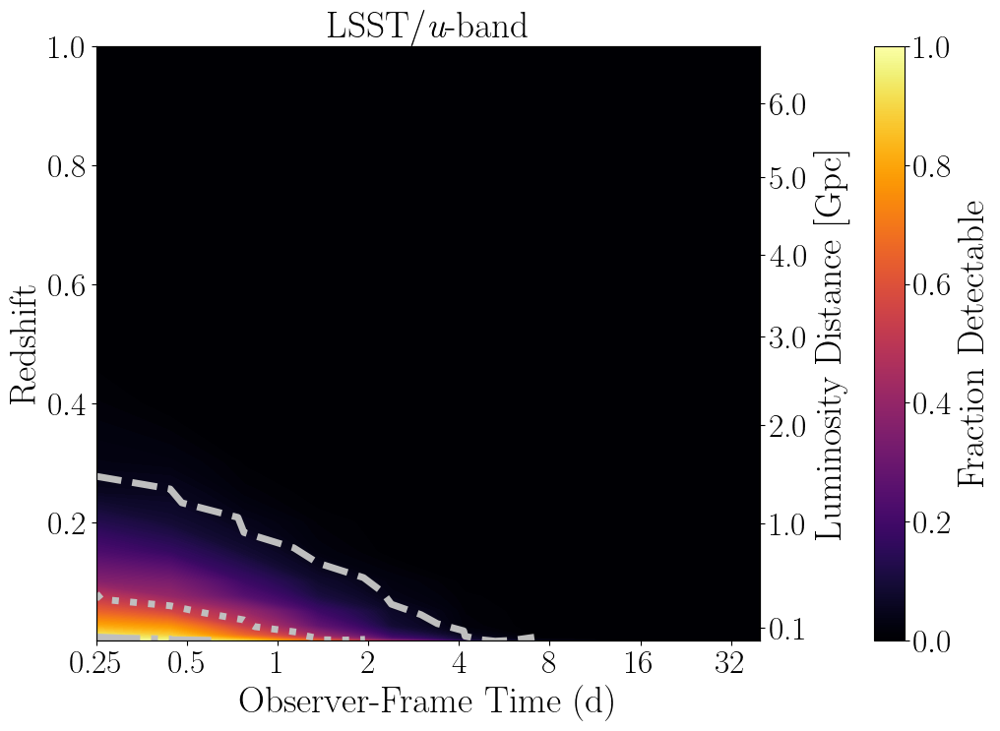

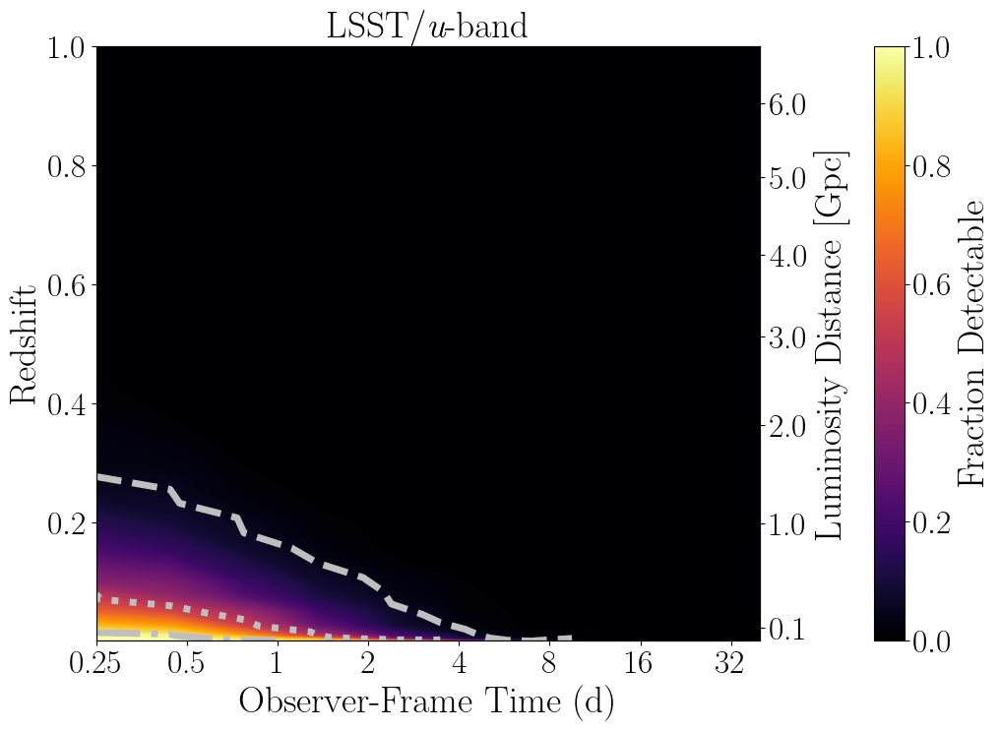

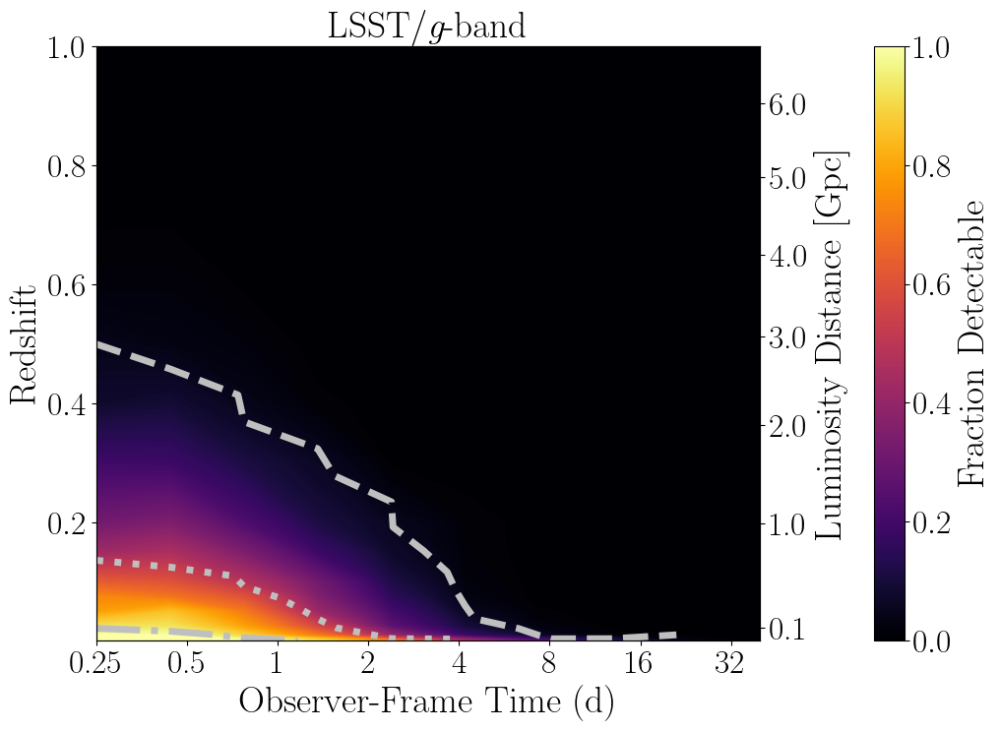

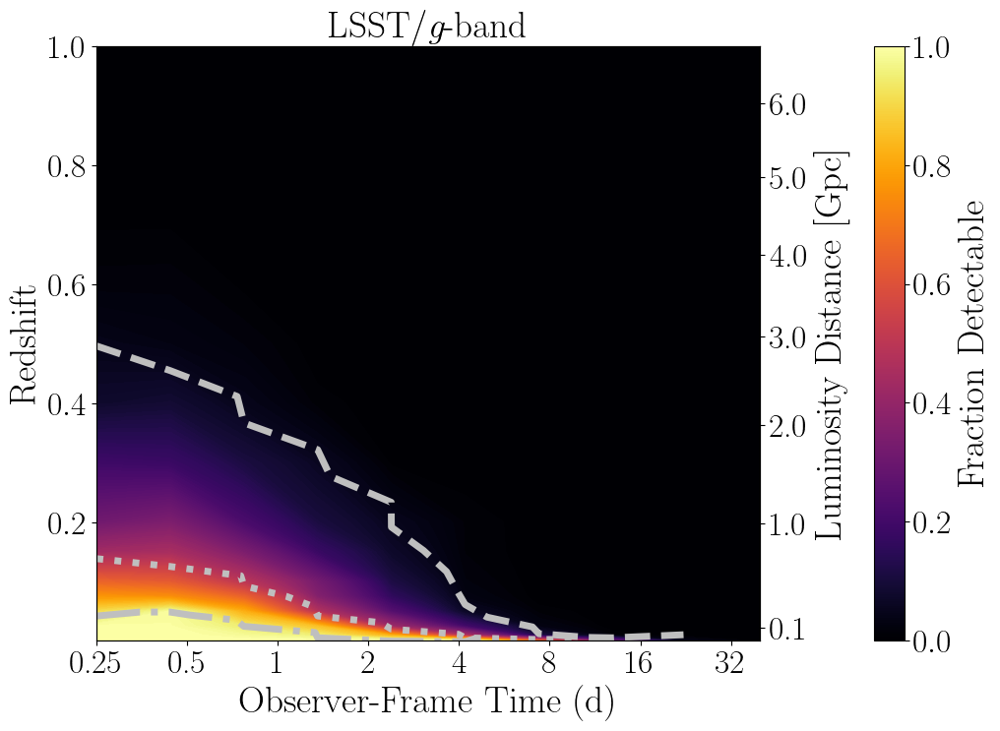

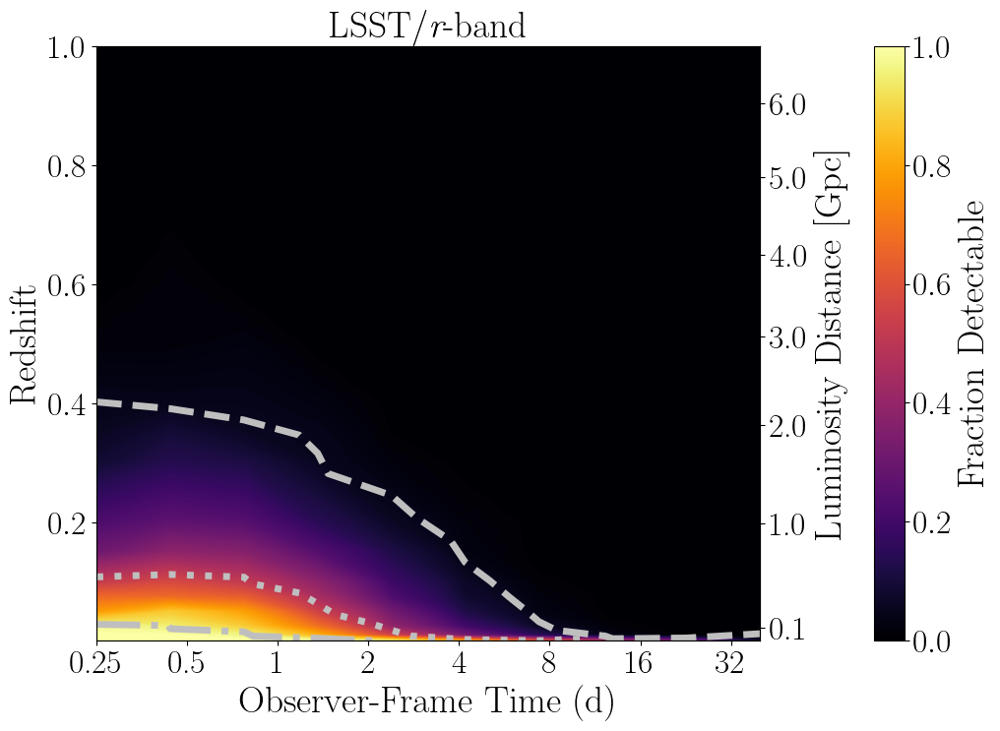

...

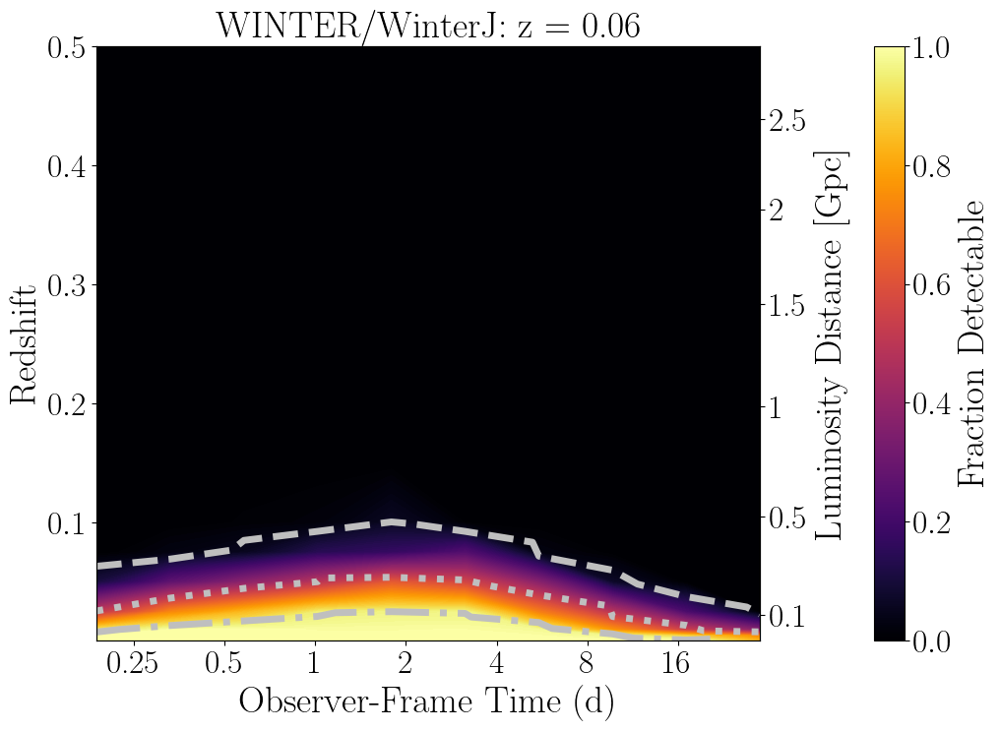

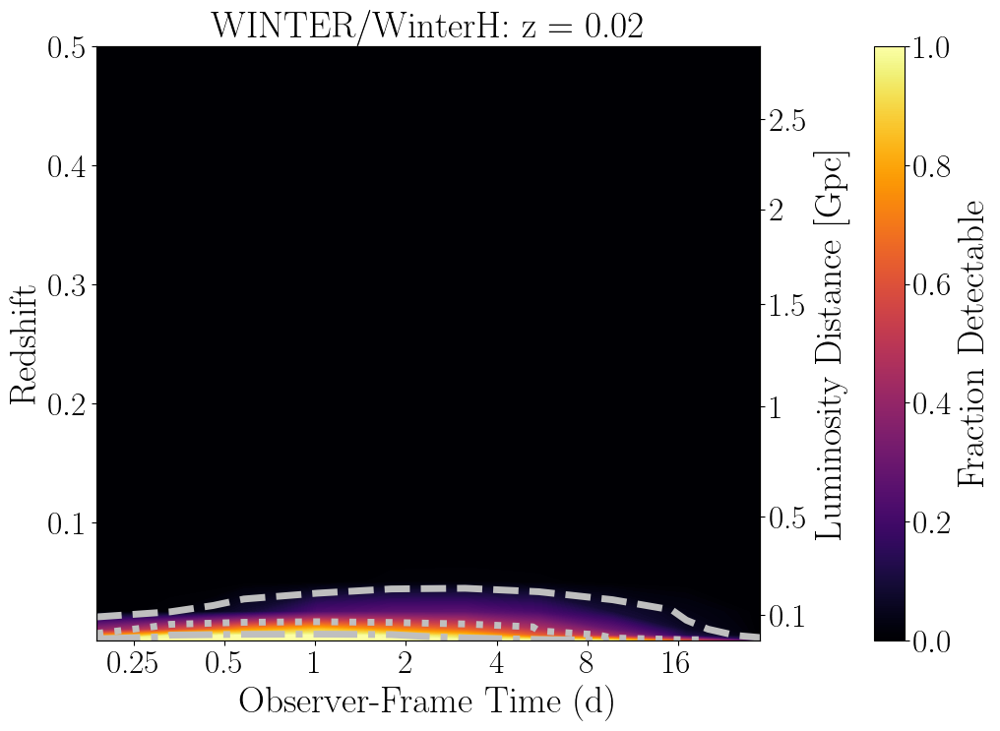

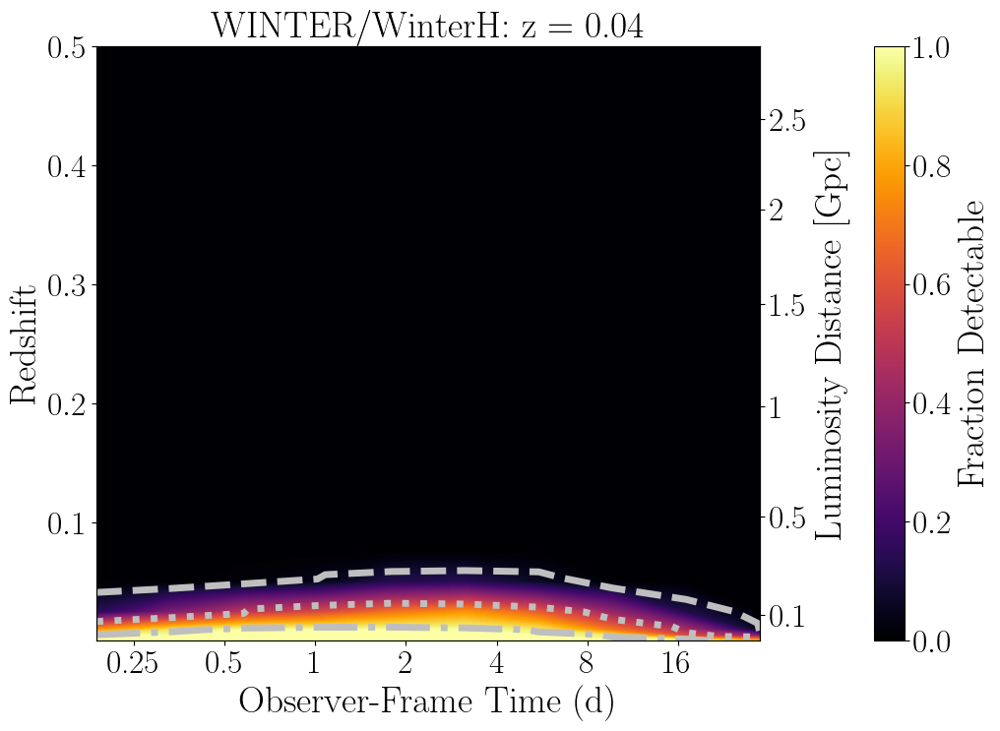

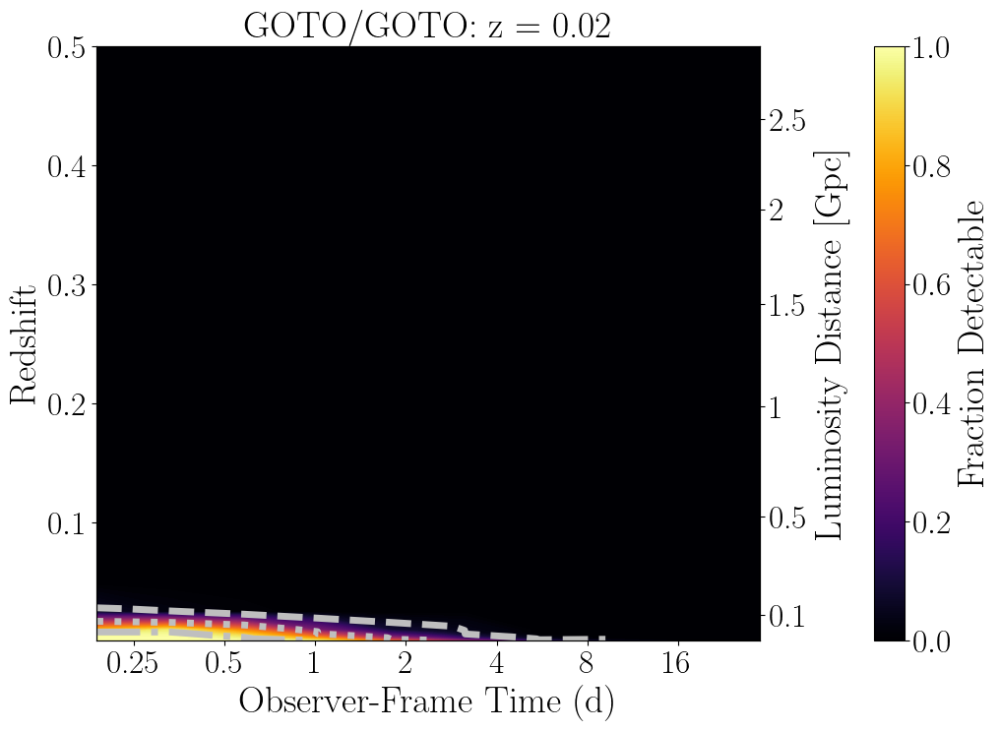

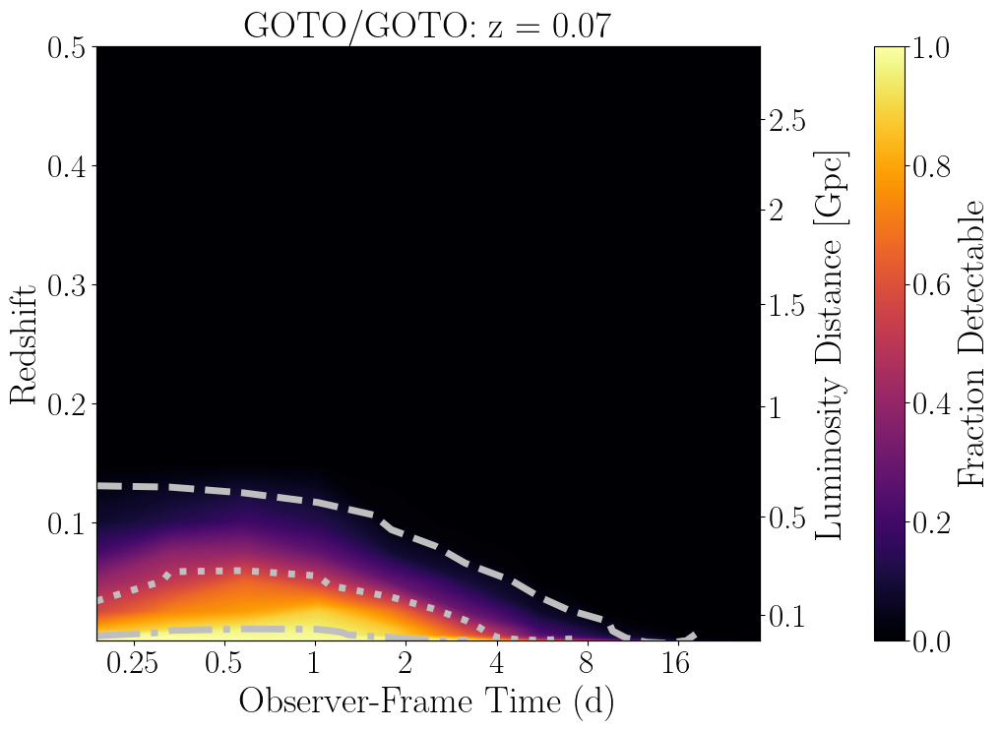

In [356]:
var_dict = {}
for prop in ['md', 'mw']:
    try:
        wavelengths, variability, instr_arr = plot_param_variability(param=prop)
        var_dict[prop] = {'wavelengths': wavelengths, 
                          'variability': variability,
                          'instr_arr':   instr_arr}
    except:
        pass



In [257]:
var_dict['md']['variability'][-4]

1.2763307209054993

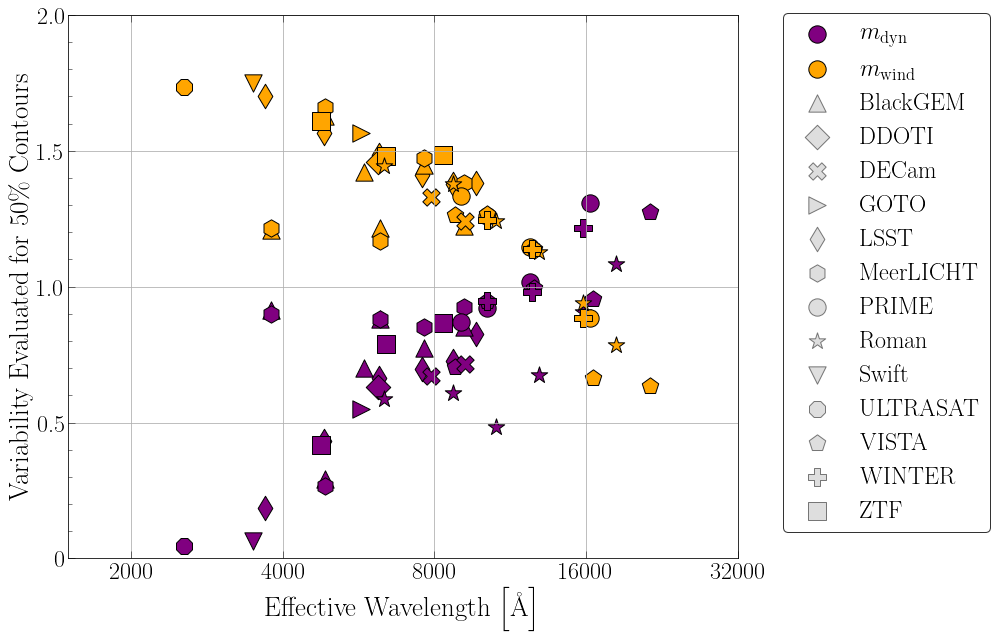

In [357]:
fig, ax = plt.subplots(figsize=(12, 10))


# This is not a great way to do this
for param, data in var_dict.items():
    
    # FIXME
    if param in ['md', 'mw']:

        wavelengths = data['wavelengths']
        variability_arr = data['variability']
        instr_arr = data['instr_arr']

        param_label = True
        if param == 'md':
            color = 'purple'
            label_str = r'$m_{\mathrm{dyn}}$'        
        elif param == 'mw':
            color = 'orange'
            label_str = r'$m_{\mathrm{wind}}$'  

        for idx, wavelength in enumerate(wavelengths):
            variability = variability_arr[idx]
            instr = instr_arr[idx]
            marker = instr_params[instr]['marker']

            label = None
            if instr == 'Dorado':
                continue
            elif instr == 'PRIME' and param_label:
                label = label_str
                param_label = False

            ax.scatter(wavelength, variability, marker=marker, color=color, s=300,
                edgecolor='k', label=label)

# Set up legend
for instr, instr_data in instr_params.items():
    ax.scatter(-wavelength, variability, marker=instr_data['marker'], color='0.75', s=300,
        label=instr_data['label'], edgecolor='k', alpha=0.5)
    
# ax.scatter(-wavelength, variability, marker='*', color='k', s=300,
#     label='Roman', edgecolor='k')
# ax.scatter(-wavelength, variability, marker='o', color='k', s=300,
#     label='LSST', edgecolor='k')



ax.set_xlim(1.5e3, 3e4)
ax.set_xscale('log')
ax.set_xlabel(r'Effective Wavelength $\left[\mathrm{\AA}\right]$')
xtick_vals = [2000, 4000, 8000, 16000, 32000]
ax.set_xticks(xtick_vals)
ax.set_xticklabels(xtick_vals)

ax.set_ylim(0, None)
ax.set_ylabel('Variability Evaluated for 50\\% Contours')
ytick_vals = [0, 0.5, 1.0, 1.5, 2.0]
ax.set_yticks(ytick_vals)
ax.set_yticklabels(ytick_vals)



ax.minorticks_on()
ax.tick_params(which='major', direction='in', length=7,
    width=0.5, top=True, bottom=True, right=False, left=True)
ax.tick_params(which='minor', direction='in', length=4,
    width=0.5, top=False, bottom=False, right=False, left=True)

ax.grid()


legend = ax.legend(loc='upper left', ncol=1, bbox_to_anchor=(1.05, 1.025))#, bbox_transform=ax.transAxes)
frame = legend.get_frame()
frame.set_edgecolor('k')


plt.savefig('/Users/r349989/Documents/kilonovae/projects/kilonova_detectability/figures/mass_variability.pdf', 
    bbox_extra_artists=(legend,), bbox_inches='tight')
